In [1]:
import numpy as np 
import pandas as pd
import json 
import csv
import nltk
import unicodedata
import re
import sys
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re
from gensim.models import Phrases
from gensim.models.phrases import Phraser

import os

In [2]:
# pip install git+https://github.com/rwalk/gsdmm.git

In [3]:
from gsdmm import MovieGroupProcess

In [4]:
df = pd.read_csv("../pos_neg_india.csv")
df

,Unnamed: 0,index,Text,new_text,languages,translated,new_languages,pos_tagged_words,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,0,0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,Unknown,soniya mummy hoti toh covid me magic stick ghu...,Unknown,"[('soniya', 'JJ'), ('mummy', 'NN'), ('hot', 'J...","['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,12,12,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,Unknown,is covid ki waja se buht saray logon ne apne p...,Unknown,"[('is', 'VBZ'), ('couid', 'JJ'), ('ki', 'NN'),...","['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,18,18,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"ENGLISH, Unknown",deaths due covid what is vaccination rate what...,"ENGLISH, Unknown","[('deaths', 'NNS'), ('due', 'JJ'), ('couid', '...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,28,28,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,ENGLISH,vaccination against covid- 19 is necessity tod...,ENGLISH,"[('vaccination', 'NN'), ('against', 'IN'), ('c...","['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,33,33,very surprising that unvaccinated population &...,very surprising that unvaccinated population &...,ENGLISH,very surprising that unvaccinated population &...,ENGLISH,"[('very', 'RB'), ('surprising', 'JJ'), ('that'...","['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37618,95179,95179,nature seems have already started working savi...,nature seems have already started working savi...,ENGLISH,nature seems have already started working savi...,ENGLISH,"[('nature', 'NN'), ('seems', 'VBZ'), ('have', ...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,95180,95180,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...",ENGLISH,"dear , we #india Indiahas helped this #world i...",ENGLISH,"[('dear', 'IN'), ('we', 'PRP'), ('india', 'VBP...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,95184,95184,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,ENGLISH,our sincere request state central govt folded_...,ENGLISH,"[('our', 'PRP$'), ('sincere', 'JJ'), ('request...","['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,95185,95185,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,ENGLISH,thanks your appreciation valuable feedback abo...,ENGLISH,"[('thanks', 'NNS'), ('your', 'PRP$'), ('apprec...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [5]:
df.drop(columns = ['Unnamed: 0', 'Text', 'index', 'new_text', 'languages', 'new_languages', 'pos_tagged_words'], inplace = True)
df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,soniya mummy hoti toh covid me magic stick ghu...,"['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,very surprising that unvaccinated population &...,"['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [6]:
df['words_processed_noun'].values[0][0]

'['

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [8]:
tokens_words_processed_noun = list(sent_to_words(df['words_processed_noun']))

In [9]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')
high_freq_known_words = ['vaccine', 'vaccination', 'covidvaccine', 'vaccinate', 'vaccinated', 'amp', 'couid', 
             'covishield', 'people', 'country', 'pfizer', 'hour', 'year', 'month', 'time', 'day', 'covid',
             'Yesterday', 'thing', 'sir', 'today', 'retweet', 'corona', 'one', 'love', 'coronavirus'  ]

stop_list.extend(high_freq_known_words)



In [10]:
stop_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [11]:
df['words_processed_noun'] = tokens_words_processed_noun

In [12]:
# remove stop words from tokenised_words_only

tokenised_stopremoved = [[w for w in each if w not in stop_list or w == 'not'] for each in tokens_words_processed_noun]
tokenised_stopremoved

[['death'],
 ['hair', 'ply'],
 ['death', 'rate', 'harm', 'harm'],
 ['necessity', 'scenario', 'problem'],
 ['population',
  'yrs',
  'offline',
  'class',
  'examination',
  'situation',
  'safety',
  'class',
  'examination'],
 ['way', 'millennium', 'peril', 'job', 'process'],
 ['symptom', 'example', 'number', 'death', 'population', 'life'],
 ['follower', 'pledge', 'service', 'humanity'],
 ['case', 'case', 'testing', 'taboo'],
 ['intellectual',
  'education',
  'leader',
  'health',
  'system',
  'pandemic',
  'nation',
  'service'],
 ['agreement', 'student', 'travel', 'guideline'],
 ['system',
  'conversion',
  'appeasement',
  'health',
  'service',
  'infection',
  'rate',
  'death',
  'rate',
  'rate',
  'welfare',
  'isis'],
 ['oppression',
  'yesterday',
  'appointment',
  'wife',
  'worker',
  'present',
  'money'],
 ['effectiveness',
  'life',
  'number',
  'rajasthan',
  'safetyfirst',
  'thursdayvibe'],
 ['campaign'],
 ['case', 'malaysia', 'booster'],
 ['age', 'fact', 'child'

In [13]:
df['words_processed_noun'].values[0][0]

'death'

In [14]:
df['tokenised_stopremoved'] = tokenised_stopremoved

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


# GSDMM for the topic modeling: 

In [16]:
np.random.seed(0)

In [17]:
df.info() # no empty rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


In [18]:
df['sentiment'].value_counts()

0    20029
2    17594
Name: sentiment, dtype: int64

In [19]:
positive_df = df[df['sentiment'] == 2]

In [20]:
positive_df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment,tokenised_stopremoved
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","[hair, ply, vaccination]",subjective,2,"[hair, ply]"
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","[death, couid, vaccination, rate, harm, harm]",subjective,2,"[death, rate, harm, harm]"
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","[necessity, today, scenario, problem]",subjective,2,"[necessity, scenario, problem]"
5,dr. deserved #1 minister's award his exception...,"['deserved', 'one', 'minister', 'award', 'exce...","['deserved', 'way', 'manage', 'thing', 'millen...","[way, thing, millennium, peril, couid, job, va...",subjective,2,"[way, millennium, peril, job, process]"
6,"yeah i still do not get why, symptoms are much...","['yeah', 'still', 'not', 'get', 'symptom', 'mu...","['still', 'symptom', 'much', 'less', 'severe',...","[symptom, vaccination, example, country, numbe...",subjective,2,"[symptom, example, number, death, population, ..."
...,...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","[nature, generation, life, strengthen]",subjective,2,"[nature, generation, life, strengthen]"
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","[world, kindnessmatter]",subjective,2,"[world, kindnessmatter]"
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","[request, state, govt, share]",subjective,2,"[request, state, govt, share]"
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","[thank, appreciation, feedback]",subjective,2,"[thank, appreciation, feedback]"


In [21]:
positive_df['tokenised_stopremoved'].values[0][0]

'hair'

In [22]:
positive_tokenised_lemmatized = list(sent_to_words(positive_df['tokenised_stopremoved']))

In [23]:
positive_tokenised_lemmatized[0][0]

'hair'

In [24]:
len(positive_tokenised_lemmatized)

17594

In [25]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

### Cluster size: 4

In [26]:
mgp = MovieGroupProcess(K=4, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 12300 clusters with 4 clusters populated
In stage 1: transferred 9677 clusters with 4 clusters populated
In stage 2: transferred 8529 clusters with 4 clusters populated
In stage 3: transferred 7933 clusters with 4 clusters populated
In stage 4: transferred 7601 clusters with 4 clusters populated
In stage 5: transferred 7116 clusters with 4 clusters populated
In stage 6: transferred 6752 clusters with 4 clusters populated
In stage 7: transferred 6577 clusters with 4 clusters populated
In stage 8: transferred 6430 clusters with 4 clusters populated
In stage 9: transferred 6282 clusters with 4 clusters populated
In stage 10: transferred 6366 clusters with 4 clusters populated
In stage 11: transferred 6159 clusters with 4 clusters populated
In stage 12: transferred 6172 clusters with 4 clusters populated
In stage 13: transferred 6155 clusters with 4 clusters populated
In stage 14: transferred 6064 clusters with 4 clusters populated
In stage 15: transferred 6023 clus

In [27]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5084 5263 5039 2208]

Most important clusters (by number of docs inside): [1 0 2 3]

Cluster 1 : [('world', 320), ('government', 312), ('student', 226), ('state', 215), ('citizen', 195), ('help', 184), ('population', 178), ('nation', 169), ('thank', 167), ('life', 166)]

Cluster 0 : [('virus', 377), ('mask', 306), ('dose', 269), ('family', 234), ('life', 182), ('case', 174), ('fight', 171), ('way', 169), ('world', 149), ('symptom', 145)]

Cluster 2 : [('thank', 718), ('dose', 481), ('family', 283), ('staff', 279), ('center', 279), ('hospital', 203), ('process', 184), ('work', 174), ('arrangement', 173), ('help', 172)]

Cluster 3 : [('travel', 117), ('quarantine', 96), ('home', 88), ('staff', 87), ('test', 86), ('family', 79), ('flight', 60), ('traveler', 57), ('mask', 56), ('injection', 55)]


In [28]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [29]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [30]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 3,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, number, death, population, ..."


In [31]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [32]:
result['Topic']

0        type 4
1        type 2
2        type 2
3        type 3
4        type 2
          ...  
17589    type 2
17590    type 2
17591    type 1
17592    type 3
17593    type 2
Name: Topic, Length: 17594, dtype: object

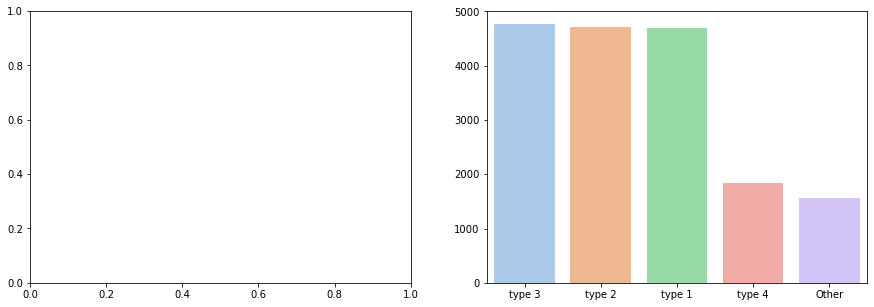

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [34]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 3,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, number, death, population, ...",39


In [35]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [36]:
result = result.drop('Lemma-text', axis=1)

In [37]:
from wordcloud import WordCloud 

In [38]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

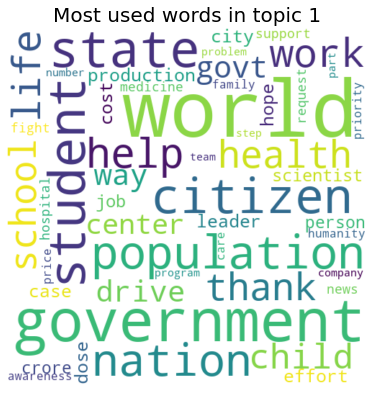

In [39]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

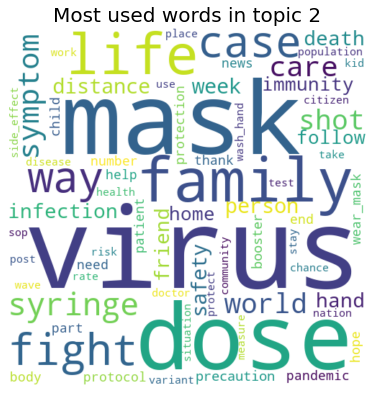

In [40]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

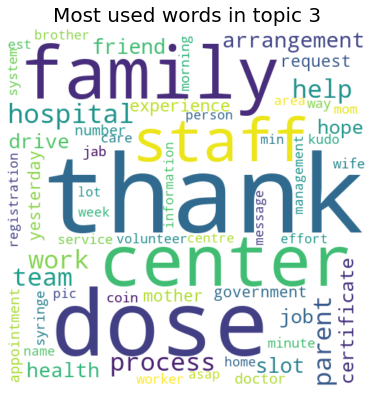

In [41]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

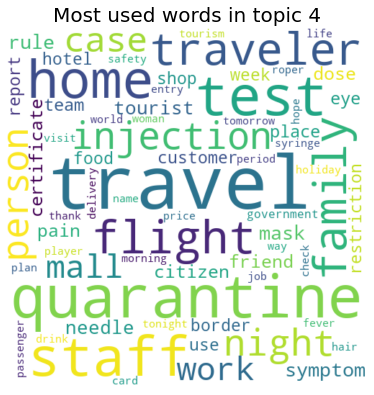

In [42]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

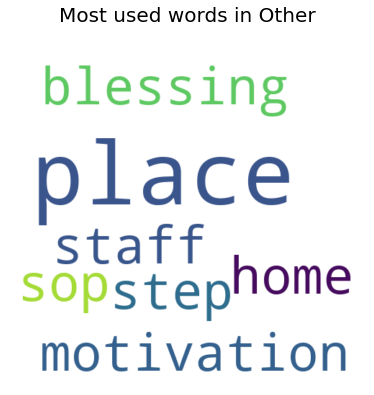

In [43]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 5

In [44]:
mgp = MovieGroupProcess(K=5, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 13067 clusters with 5 clusters populated
In stage 1: transferred 10530 clusters with 5 clusters populated
In stage 2: transferred 9247 clusters with 5 clusters populated
In stage 3: transferred 8573 clusters with 5 clusters populated
In stage 4: transferred 7917 clusters with 5 clusters populated
In stage 5: transferred 7592 clusters with 5 clusters populated
In stage 6: transferred 7264 clusters with 5 clusters populated
In stage 7: transferred 7227 clusters with 5 clusters populated
In stage 8: transferred 6944 clusters with 5 clusters populated
In stage 9: transferred 6722 clusters with 5 clusters populated
In stage 10: transferred 6648 clusters with 5 clusters populated
In stage 11: transferred 6476 clusters with 5 clusters populated
In stage 12: transferred 6501 clusters with 5 clusters populated
In stage 13: transferred 6411 clusters with 5 clusters populated
In stage 14: transferred 6297 clusters with 5 clusters populated
In stage 15: transferred 6255 clu

In [45]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [2231 3397 4826 2255 4885]

Most important clusters (by number of docs inside): [4 2 1 3 0]

Cluster 4 : [('thank', 637), ('dose', 492), ('center', 303), ('staff', 272), ('family', 269), ('help', 212), ('process', 184), ('arrangement', 174), ('hospital', 172), ('slot', 162)]

Cluster 2 : [('virus', 350), ('mask', 293), ('dose', 212), ('student', 205), ('case', 198), ('child', 186), ('family', 176), ('life', 164), ('way', 151), ('fight', 142)]

Cluster 1 : [('thank', 258), ('world', 220), ('health', 150), ('work', 149), ('life', 142), ('family', 130), ('government', 128), ('citizen', 116), ('effort', 112), ('nation', 112)]

Cluster 3 : [('travel', 125), ('quarantine', 103), ('staff', 97), ('home', 92), ('dose', 89), ('test', 89), ('family', 83), ('symptom', 69), ('injection', 68), ('traveler', 62)]

Cluster 0 : [('government', 138), ('world', 119), ('state', 104), ('population', 103), ('price', 84), ('production', 78), ('nation', 72), ('govt', 63), ('news

In [46]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [47]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [48]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 1,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, number, death, population, ..."


In [49]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [50]:
result['Topic']

0        type 4
1        type 2
2        type 1
3        type 1
4        type 2
          ...  
17589    type 3
17590    type 3
17591    type 5
17592    type 1
17593    type 2
Name: Topic, Length: 17594, dtype: object

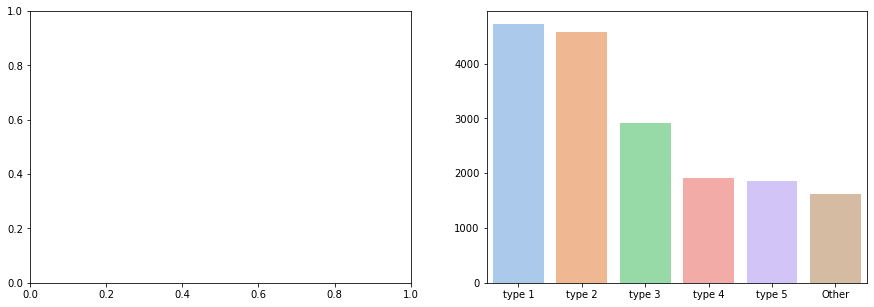

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [52]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 1,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 2,"[symptom, example, number, death, population, ...",39


In [53]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [54]:
result = result.drop('Lemma-text', axis=1)

In [55]:
from wordcloud import WordCloud 

In [56]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

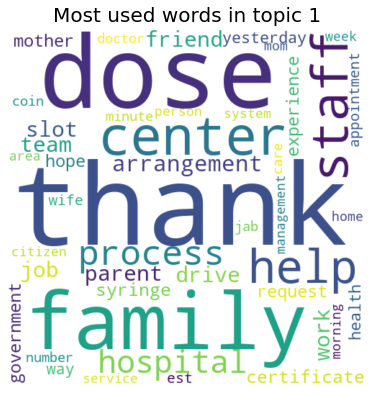

In [57]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

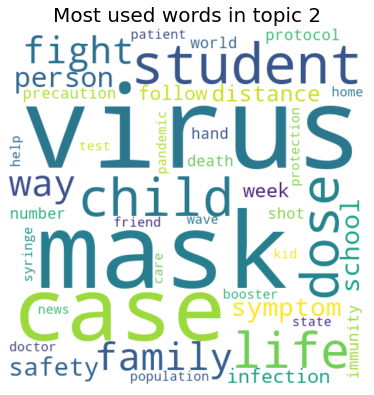

In [58]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

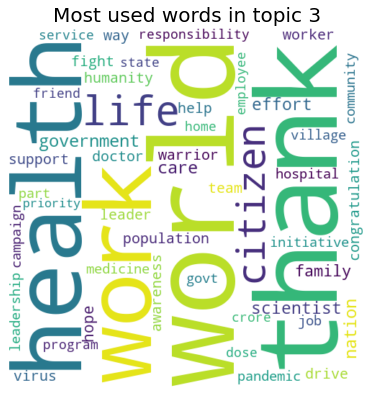

In [59]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

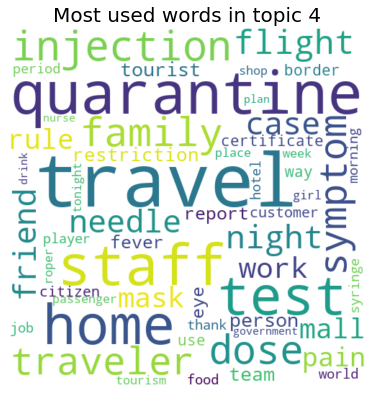

In [60]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

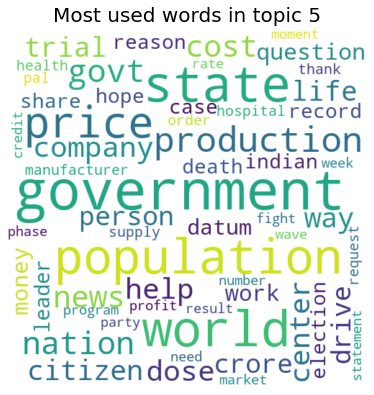

In [61]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

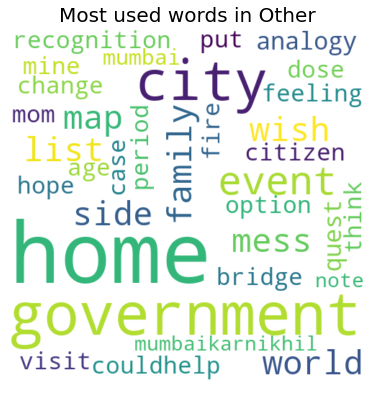

In [62]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 6

In [63]:
mgp = MovieGroupProcess(K=6, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 13689 clusters with 6 clusters populated
In stage 1: transferred 10852 clusters with 6 clusters populated
In stage 2: transferred 9598 clusters with 6 clusters populated
In stage 3: transferred 8769 clusters with 6 clusters populated
In stage 4: transferred 8346 clusters with 6 clusters populated
In stage 5: transferred 7983 clusters with 6 clusters populated
In stage 6: transferred 7685 clusters with 6 clusters populated
In stage 7: transferred 7427 clusters with 6 clusters populated
In stage 8: transferred 7385 clusters with 6 clusters populated
In stage 9: transferred 7215 clusters with 6 clusters populated
In stage 10: transferred 7087 clusters with 6 clusters populated
In stage 11: transferred 6913 clusters with 6 clusters populated
In stage 12: transferred 6786 clusters with 6 clusters populated
In stage 13: transferred 6802 clusters with 6 clusters populated
In stage 14: transferred 6614 clusters with 6 clusters populated
In stage 15: transferred 6597 clu

In [64]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [2003 3127 2523  378 5107 4456]

Most important clusters (by number of docs inside): [4 5 1 2 0 3]

Cluster 4 : [('world', 316), ('government', 304), ('thank', 275), ('citizen', 206), ('state', 195), ('work', 175), ('nation', 175), ('help', 170), ('health', 166), ('hope', 163)]

Cluster 5 : [('thank', 622), ('dose', 453), ('staff', 268), ('center', 266), ('family', 226), ('process', 179), ('help', 170), ('slot', 168), ('hospital', 166), ('arrangement', 151)]

Cluster 1 : [('virus', 223), ('dose', 199), ('case', 174), ('population', 127), ('symptom', 123), ('world', 121), ('way', 121), ('infection', 118), ('life', 116), ('death', 111)]

Cluster 2 : [('mask', 263), ('family', 188), ('virus', 142), ('friend', 119), ('dose', 119), ('syringe', 117), ('safety', 113), ('distance', 112), ('hand', 105), ('home', 98)]

Cluster 0 : [('student', 222), ('travel', 140), ('school', 118), ('staff', 99), ('quarantine', 96), ('child', 90), ('test', 85), ('home', 72), ('fl

In [65]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [66]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [67]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 5,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 2,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, number, death, population, ..."


In [68]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [69]:
result['Topic']

0        type 5
1        type 3
2        type 1
3        type 2
4        type 3
          ...  
17589    type 3
17590    type 4
17591    type 1
17592    type 2
17593    type 4
Name: Topic, Length: 17594, dtype: object

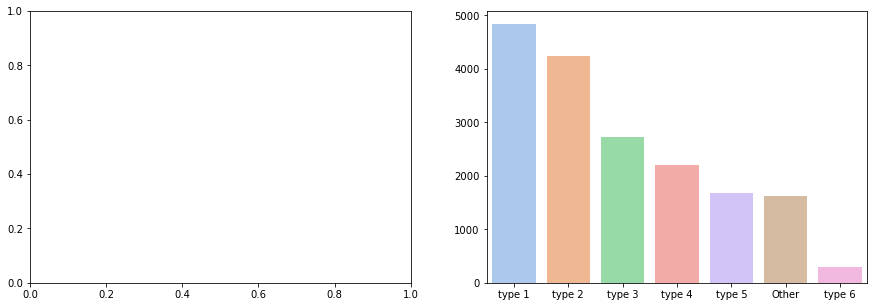

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [71]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 5,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 2,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, number, death, population, ...",39


In [72]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [73]:
result = result.drop('Lemma-text', axis=1)

In [74]:
from wordcloud import WordCloud 

In [75]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

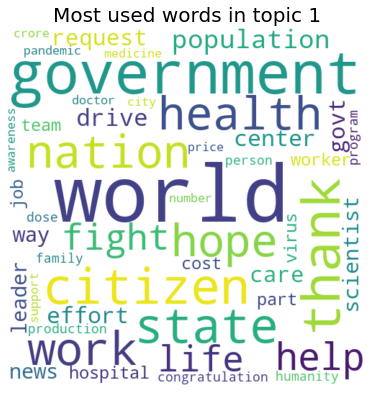

In [76]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

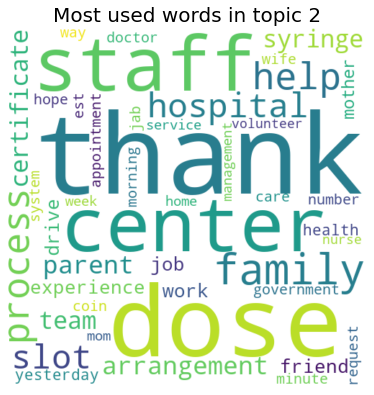

In [77]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

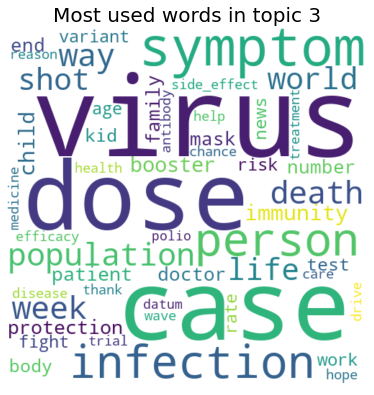

In [78]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

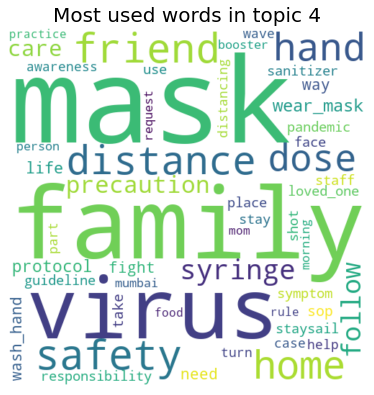

In [79]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

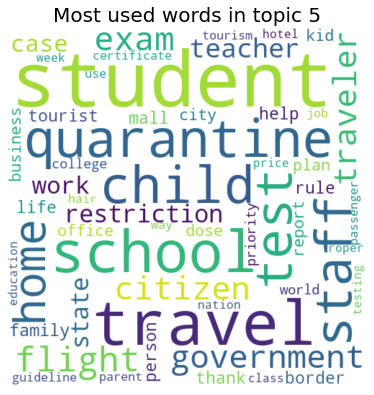

In [80]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

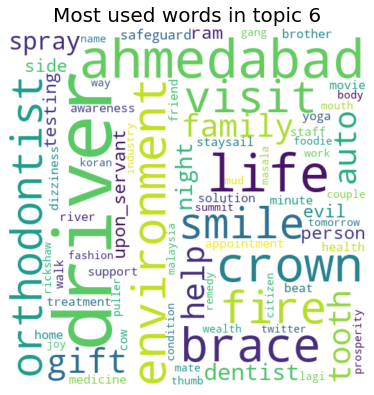

In [81]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

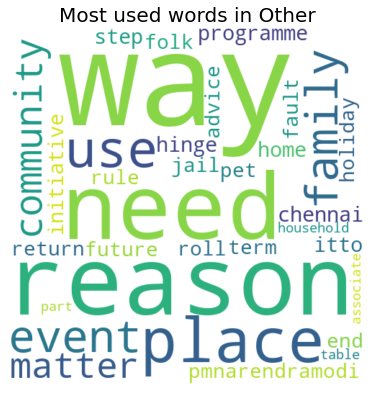

In [82]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 7

In [83]:
mgp = MovieGroupProcess(K=7, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14064 clusters with 7 clusters populated
In stage 1: transferred 11291 clusters with 7 clusters populated
In stage 2: transferred 10026 clusters with 7 clusters populated
In stage 3: transferred 9275 clusters with 7 clusters populated
In stage 4: transferred 8883 clusters with 7 clusters populated
In stage 5: transferred 8360 clusters with 7 clusters populated
In stage 6: transferred 8062 clusters with 7 clusters populated
In stage 7: transferred 7879 clusters with 7 clusters populated
In stage 8: transferred 7726 clusters with 7 clusters populated
In stage 9: transferred 7629 clusters with 7 clusters populated
In stage 10: transferred 7401 clusters with 7 clusters populated
In stage 11: transferred 7280 clusters with 7 clusters populated
In stage 12: transferred 7118 clusters with 7 clusters populated
In stage 13: transferred 7148 clusters with 7 clusters populated
In stage 14: transferred 7144 clusters with 7 clusters populated
In stage 15: transferred 7055 cl

In [84]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [3123 2282 1090 2394  718 3929 4058]

Most important clusters (by number of docs inside): [6 5 0 3 1 2 4]

Cluster 6 : [('mask', 293), ('family', 241), ('student', 217), ('virus', 199), ('child', 183), ('life', 167), ('school', 151), ('case', 146), ('safety', 144), ('dose', 138)]

Cluster 5 : [('thank', 583), ('dose', 339), ('staff', 301), ('center', 268), ('hospital', 180), ('arrangement', 176), ('process', 160), ('team', 160), ('drive', 149), ('family', 142)]

Cluster 0 : [('world', 270), ('government', 199), ('citizen', 138), ('nation', 138), ('population', 136), ('thank', 134), ('state', 134), ('work', 119), ('health', 111), ('govt', 106)]

Cluster 3 : [('dose', 201), ('thank', 165), ('family', 145), ('certificate', 130), ('help', 126), ('life', 93), ('person', 70), ('friend', 67), ('work', 66), ('number', 63)]

Cluster 1 : [('virus', 186), ('dose', 138), ('case', 107), ('week', 94), ('population', 92), ('news', 92), ('number', 87), ('way', 84), ('de

In [85]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [86]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [87]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 2,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 5,"[symptom, example, number, death, population, ..."


In [88]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [89]:
result['Topic']

0        type 4
1        type 1
2        type 1
3        type 2
4        type 5
          ...  
17589    type 5
17590    type 3
17591    type 3
17592    type 2
17593    type 1
Name: Topic, Length: 17594, dtype: object

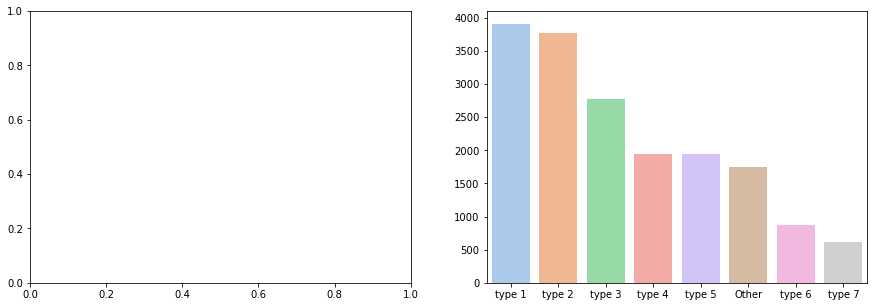

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [91]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 2,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 5,"[symptom, example, number, death, population, ...",39


In [92]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [93]:
result = result.drop('Lemma-text', axis=1)

In [94]:
from wordcloud import WordCloud 

In [95]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

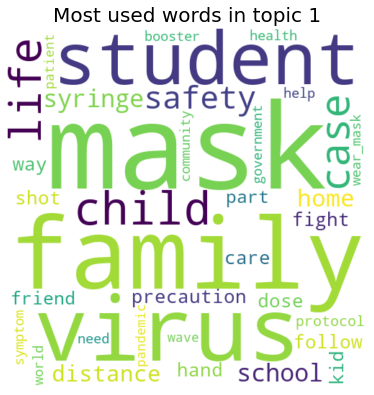

In [96]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

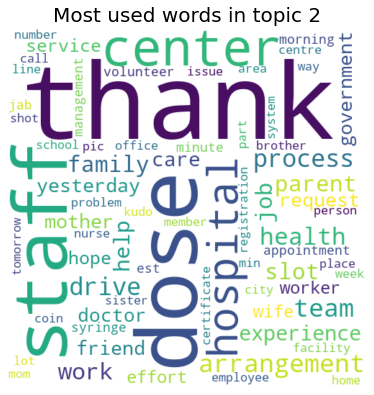

In [97]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

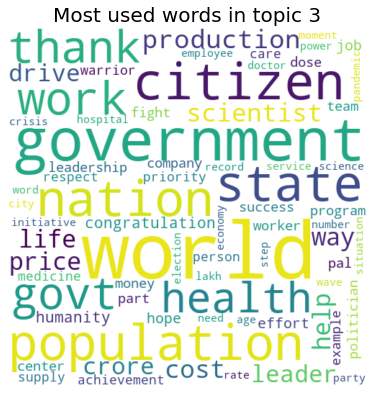

In [98]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

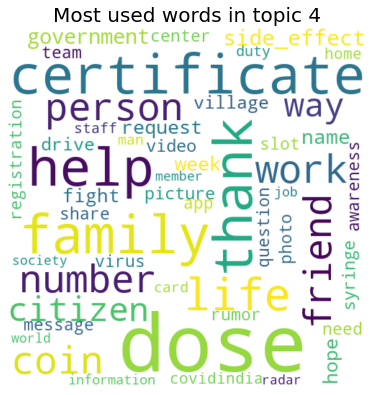

In [99]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

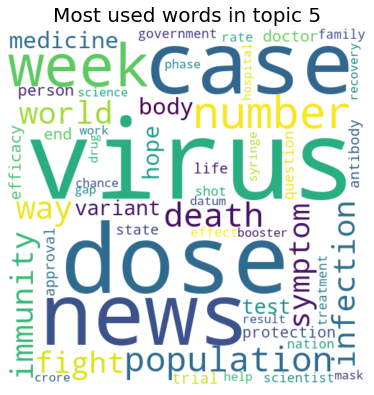

In [100]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

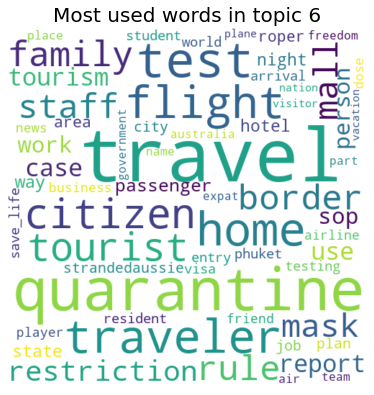

In [101]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

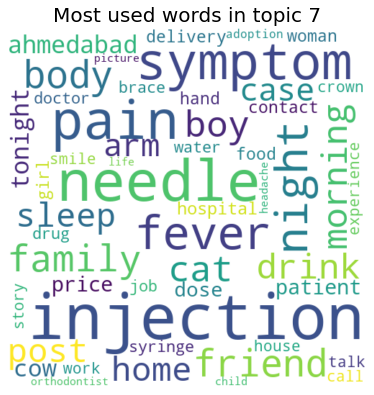

In [102]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

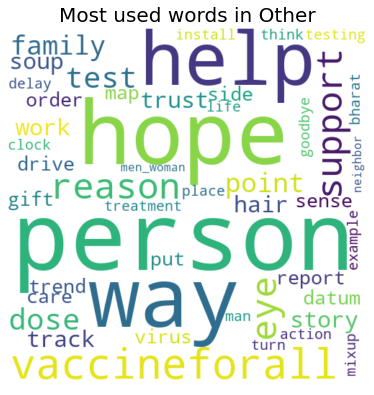

In [103]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 8

In [104]:
mgp = MovieGroupProcess(K=8, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14343 clusters with 8 clusters populated
In stage 1: transferred 11507 clusters with 8 clusters populated
In stage 2: transferred 10154 clusters with 8 clusters populated
In stage 3: transferred 9457 clusters with 8 clusters populated
In stage 4: transferred 8957 clusters with 8 clusters populated
In stage 5: transferred 8649 clusters with 8 clusters populated
In stage 6: transferred 8380 clusters with 8 clusters populated
In stage 7: transferred 8233 clusters with 8 clusters populated
In stage 8: transferred 7910 clusters with 8 clusters populated
In stage 9: transferred 7805 clusters with 8 clusters populated
In stage 10: transferred 7803 clusters with 8 clusters populated
In stage 11: transferred 7785 clusters with 8 clusters populated
In stage 12: transferred 7598 clusters with 8 clusters populated
In stage 13: transferred 7560 clusters with 8 clusters populated
In stage 14: transferred 7364 clusters with 8 clusters populated
In stage 15: transferred 7211 cl

In [105]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 354  999 2266 1269 3466 4228  221 4791]

Most important clusters (by number of docs inside): [7 5 4 2 3 1 0 6]

Cluster 7 : [('thank', 600), ('dose', 373), ('staff', 354), ('center', 298), ('help', 232), ('student', 194), ('hospital', 188), ('government', 185), ('family', 181), ('arrangement', 179)]

Cluster 5 : [('world', 312), ('virus', 229), ('citizen', 172), ('fight', 170), ('health', 170), ('government', 168), ('population', 166), ('thank', 161), ('work', 156), ('drive', 136)]

Cluster 4 : [('dose', 335), ('family', 222), ('thank', 170), ('symptom', 159), ('life', 151), ('case', 139), ('week', 137), ('virus', 133), ('child', 122), ('person', 117)]

Cluster 2 : [('mask', 283), ('dose', 123), ('syringe', 122), ('family', 121), ('virus', 118), ('distance', 109), ('friend', 101), ('safety', 97), ('hand', 93), ('follow', 88)]

Cluster 3 : [('government', 83), ('world', 71), ('production', 65), ('price', 64), ('state', 63), ('nation', 51), ('cost', 51),

In [106]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [107]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [108]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 1,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, number, death, population, ..."


In [109]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [110]:
result['Topic']

0        type 1
1        type 3
2        type 1
3        type 1
4        type 3
          ...  
17589    type 2
17590    type 2
17591    type 2
17592    type 1
17593    type 4
Name: Topic, Length: 17594, dtype: object

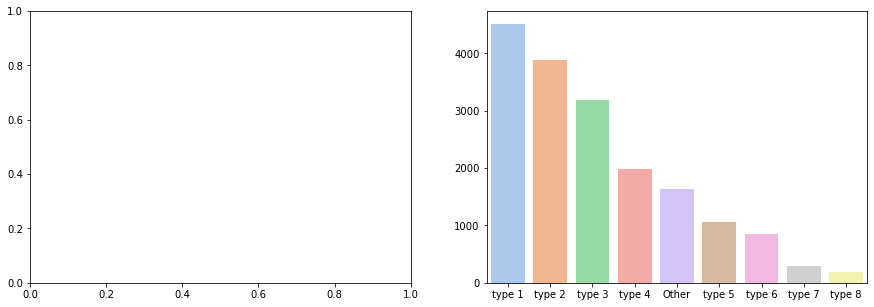

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [112]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 1,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 1,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[symptom, example, number, death, population, ...",39


In [113]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [114]:
result = result.drop('Lemma-text', axis=1)

In [115]:
from wordcloud import WordCloud 

In [116]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

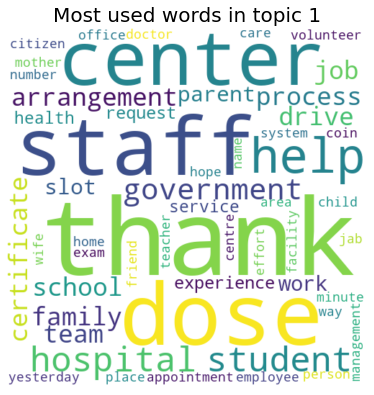

In [117]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

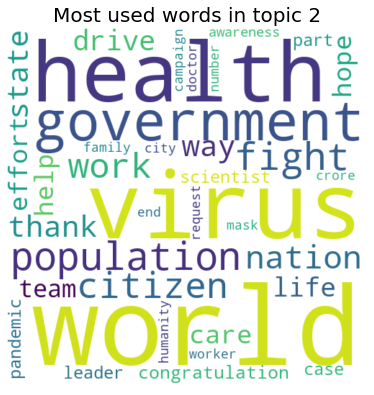

In [118]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

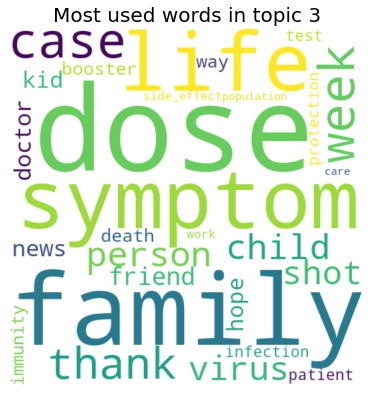

In [119]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

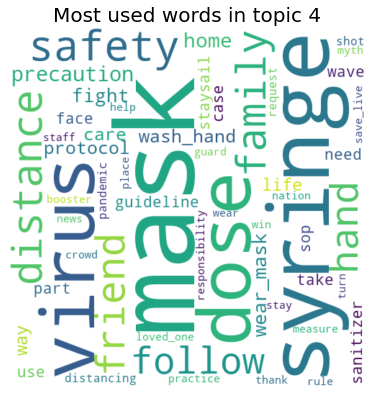

In [120]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

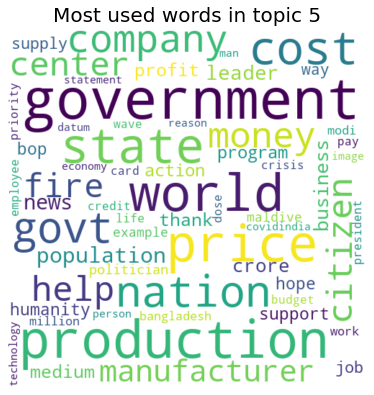

In [121]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

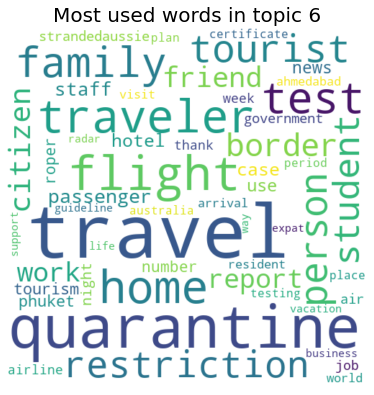

In [122]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

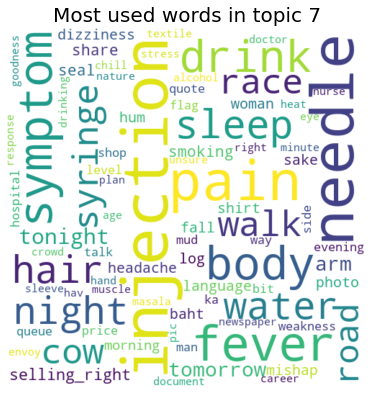

In [123]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

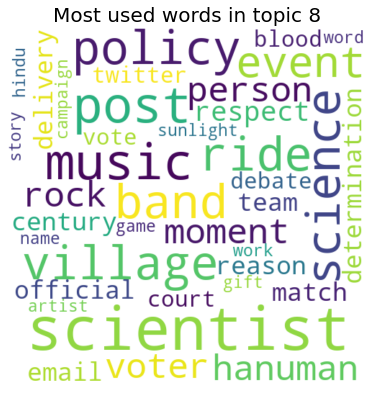

In [124]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

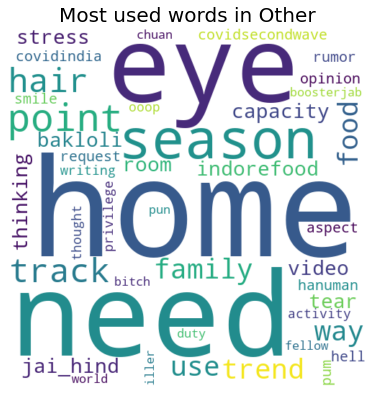

In [125]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 9

In [126]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14715 clusters with 9 clusters populated
In stage 1: transferred 11840 clusters with 9 clusters populated
In stage 2: transferred 10406 clusters with 9 clusters populated
In stage 3: transferred 9451 clusters with 9 clusters populated
In stage 4: transferred 8790 clusters with 9 clusters populated
In stage 5: transferred 8317 clusters with 9 clusters populated
In stage 6: transferred 7974 clusters with 9 clusters populated
In stage 7: transferred 7658 clusters with 9 clusters populated
In stage 8: transferred 7438 clusters with 9 clusters populated
In stage 9: transferred 7342 clusters with 9 clusters populated
In stage 10: transferred 7244 clusters with 9 clusters populated
In stage 11: transferred 7157 clusters with 9 clusters populated
In stage 12: transferred 7048 clusters with 9 clusters populated
In stage 13: transferred 6905 clusters with 9 clusters populated
In stage 14: transferred 6741 clusters with 9 clusters populated
In stage 15: transferred 6723 cl

In [127]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [4582 1340   86 2507  164 1019 5262  241 2393]

Most important clusters (by number of docs inside): [6 0 3 8 1 5 7 4 2]

Cluster 6 : [('virus', 398), ('mask', 315), ('dose', 271), ('family', 258), ('life', 190), ('way', 188), ('fight', 186), ('world', 183), ('case', 176), ('care', 145)]

Cluster 0 : [('thank', 706), ('dose', 469), ('staff', 308), ('center', 290), ('family', 259), ('process', 187), ('drive', 185), ('team', 177), ('help', 170), ('hospital', 168)]

Cluster 3 : [('student', 233), ('school', 158), ('help', 125), ('child', 123), ('government', 122), ('state', 110), ('life', 106), ('citizen', 106), ('staff', 98), ('center', 80)]

Cluster 8 : [('world', 239), ('government', 142), ('nation', 117), ('population', 106), ('thank', 105), ('scientist', 83), ('work', 78), ('production', 77), ('state', 77), ('leader', 74)]

Cluster 1 : [('symptom', 80), ('dose', 72), ('injection', 71), ('family', 63), ('syringe', 54), ('pain', 53), ('needle', 50), ('fri

In [128]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [129]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [130]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 3,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 3,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 4,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 1,"[symptom, example, number, death, population, ..."


In [131]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [132]:
result['Topic']

0        type 3
1        type 1
2        type 3
3        type 4
4        type 1
          ...  
17589    type 1
17590    type 4
17591    type 3
17592    type 2
17593    type 1
Name: Topic, Length: 17594, dtype: object

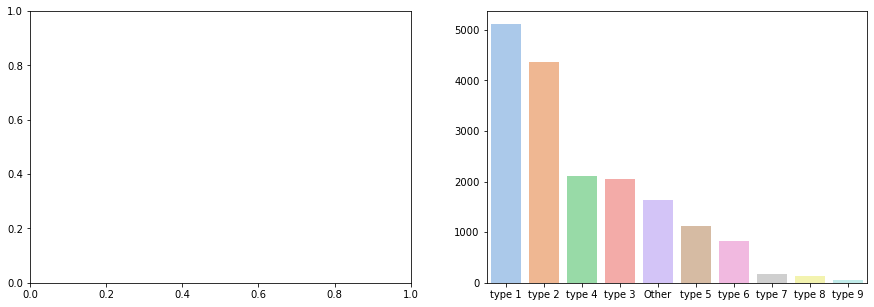

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [134]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 3,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 4,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[symptom, example, number, death, population, ...",39


In [135]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [136]:
result = result.drop('Lemma-text', axis=1)

In [137]:
from wordcloud import WordCloud 

In [138]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

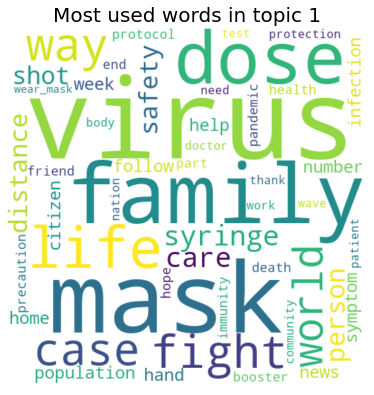

In [139]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

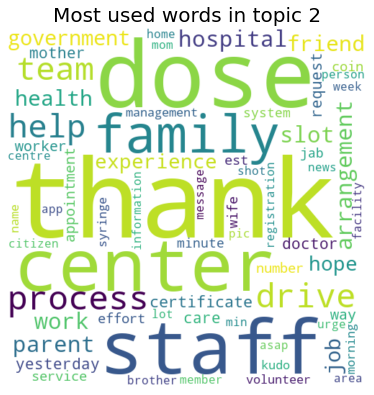

In [140]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

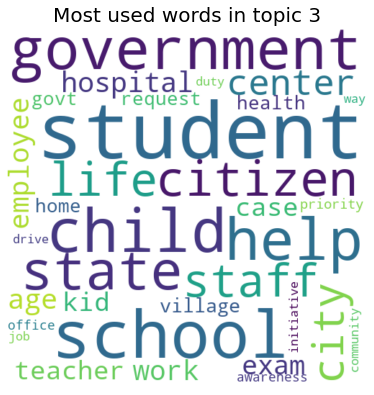

In [141]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

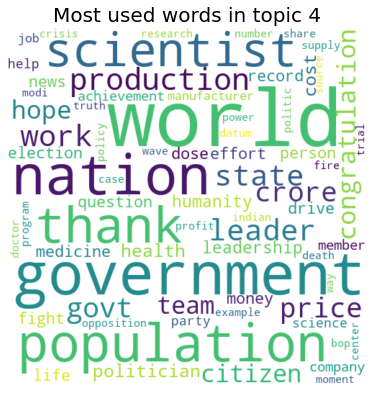

In [142]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

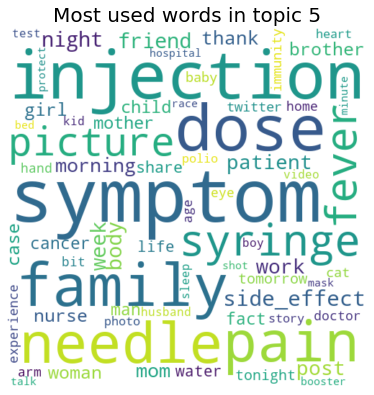

In [143]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

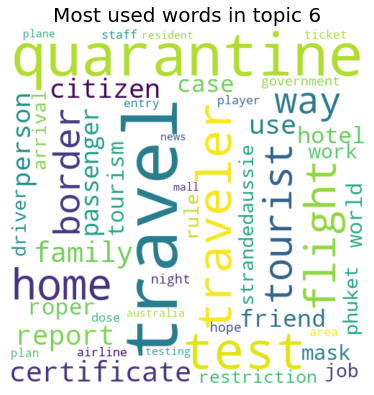

In [144]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

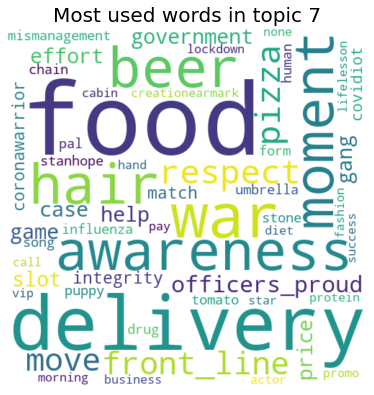

In [145]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

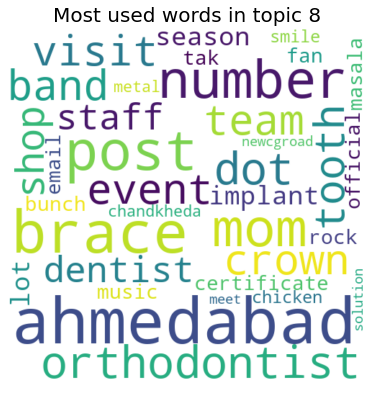

In [146]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

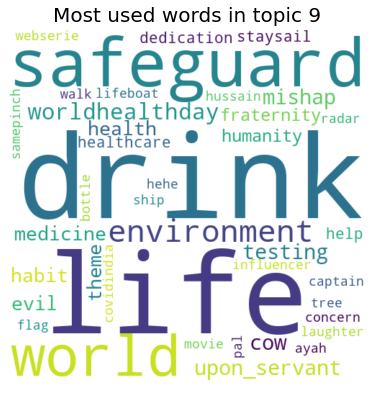

In [147]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

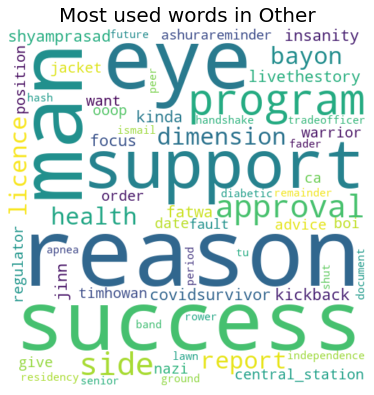

In [148]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 10

In [149]:
mgp = MovieGroupProcess(K=10, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14876 clusters with 10 clusters populated
In stage 1: transferred 12008 clusters with 10 clusters populated
In stage 2: transferred 10739 clusters with 10 clusters populated
In stage 3: transferred 9937 clusters with 10 clusters populated
In stage 4: transferred 9460 clusters with 10 clusters populated
In stage 5: transferred 9015 clusters with 10 clusters populated
In stage 6: transferred 8501 clusters with 10 clusters populated
In stage 7: transferred 8181 clusters with 10 clusters populated
In stage 8: transferred 7836 clusters with 10 clusters populated
In stage 9: transferred 7628 clusters with 10 clusters populated
In stage 10: transferred 7375 clusters with 10 clusters populated
In stage 11: transferred 7328 clusters with 10 clusters populated
In stage 12: transferred 7274 clusters with 10 clusters populated
In stage 13: transferred 7008 clusters with 10 clusters populated
In stage 14: transferred 7101 clusters with 10 clusters populated
In stage 15: tran

In [150]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [3554  746 3964   86   46 3427 1822 3649  194  106]

Most important clusters (by number of docs inside): [2 7 0 5 6 1 8 9 3 4]

Cluster 2 : [('virus', 341), ('mask', 300), ('dose', 222), ('family', 187), ('case', 169), ('fight', 148), ('syringe', 140), ('way', 134), ('symptom', 133), ('life', 131)]

Cluster 7 : [('world', 313), ('government', 218), ('population', 171), ('state', 138), ('nation', 135), ('thank', 129), ('citizen', 128), ('work', 116), ('dose', 112), ('production', 105)]

Cluster 0 : [('thank', 278), ('family', 208), ('help', 193), ('center', 182), ('staff', 171), ('health', 169), ('drive', 150), ('hospital', 147), ('work', 145), ('care', 126)]

Cluster 5 : [('thank', 517), ('dose', 452), ('center', 190), ('family', 176), ('staff', 173), ('slot', 160), ('process', 150), ('experience', 126), ('arrangement', 120), ('friend', 119)]

Cluster 6 : [('travel', 142), ('test', 108), ('quarantine', 108), ('certificate', 73), ('home', 72), ('traveler'

In [151]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9',
               'type 10'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [152]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [153]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]"
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
2,vaccination against covid- 19 is necessity tod...,type 3,"[necessity, scenario, problem]"
3,dr. deserved #1 minister's award his exception...,type 4,"[way, millennium, peril, job, process]"
4,"yeah i still do not get why, symptoms are much...",type 1,"[symptom, example, number, death, population, ..."


In [154]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [155]:
result['Topic']

0         Other
1        type 1
2        type 3
3        type 4
4        type 1
          ...  
17589    type 2
17590    type 2
17591    type 2
17592    type 4
17593    type 1
Name: Topic, Length: 17594, dtype: object

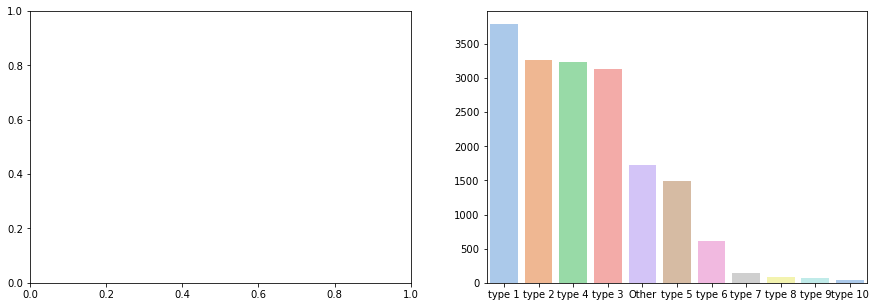

In [156]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [157]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]",37
1,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[necessity, scenario, problem]",17
3,dr. deserved #1 minister's award his exception...,type 4,"[way, millennium, peril, job, process]",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[symptom, example, number, death, population, ...",39


In [158]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [159]:
result = result.drop('Lemma-text', axis=1)

In [160]:
from wordcloud import WordCloud 

In [161]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

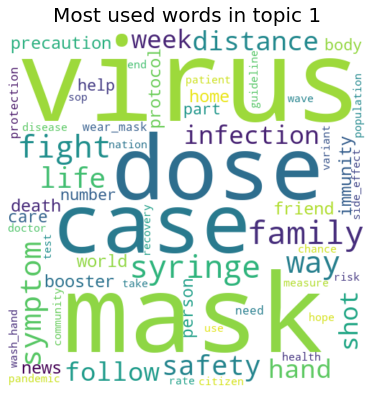

In [162]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

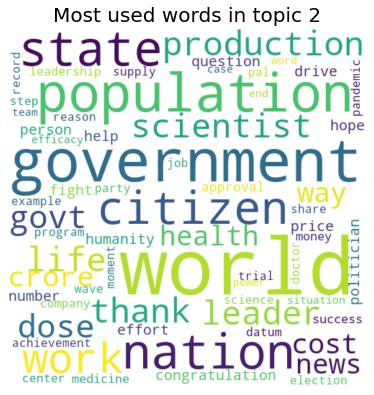

In [163]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

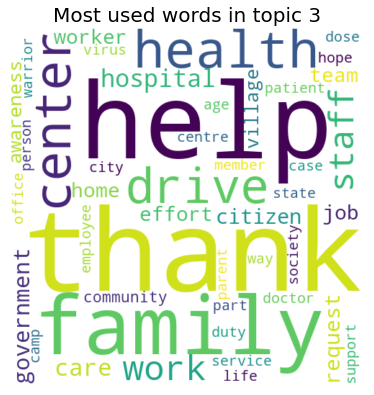

In [164]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

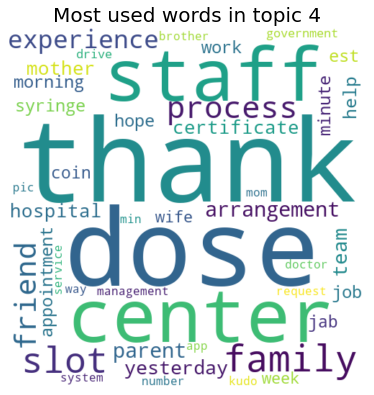

In [165]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

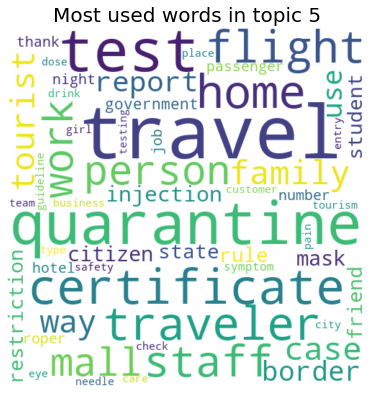

In [166]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

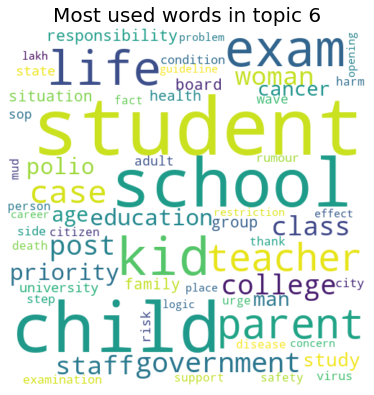

In [167]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

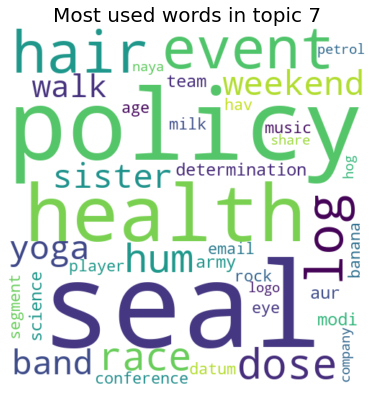

In [168]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

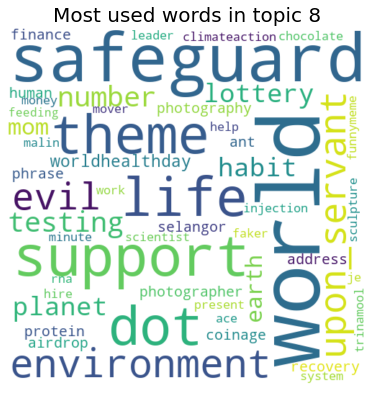

In [169]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

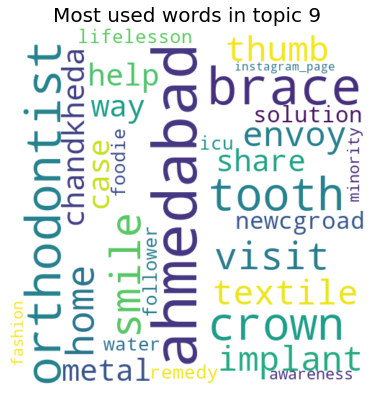

In [170]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

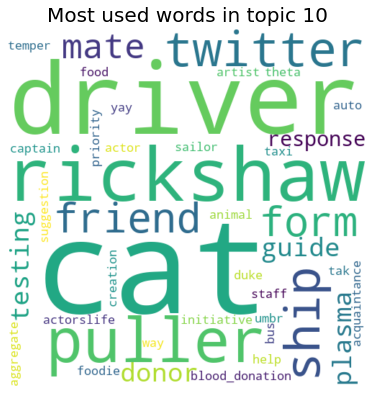

In [171]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 10'], title="Most used words in topic 10")

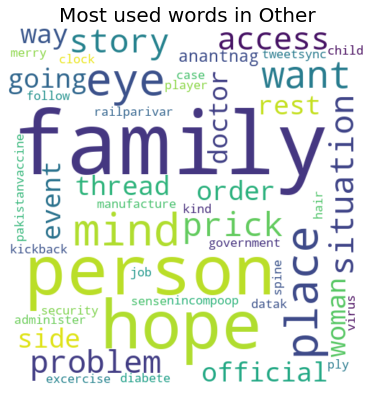

In [172]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")